# NHS Hydat Database

In [ ]:
import pandas as pd
import sqlite3
import hvplot.pandas
import cartopy.crs as ccrs
import geopandas as gpd

In [2]:
def create_connection(db_file):
    """ create a database connection to a SQLite database """
    con = None
    try:
        con = sqlite3.connect(db_file)
    except Error as e:
        print(e)
        
    return con

In [3]:
con = create_connection(r"data/Hydat.sqlite3")

In [4]:
cursor = con.cursor()
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())

[('STATIONS',), ('CONCENTRATION_SYMBOLS',), ('SED_SAMPLES_PSD',), ('ANNUAL_INSTANT_PEAKS',), ('STN_DATUM_UNRELATED',), ('DATA_SYMBOLS',), ('SED_VERTICAL_LOCATION',), ('STN_DATA_COLLECTION',), ('PEAK_CODES',), ('SED_DATA_TYPES',), ('MEASUREMENT_CODES',), ('SED_VERTICAL_SYMBOLS',), ('DATA_TYPES',), ('DLY_FLOWS',), ('STN_REMARKS',), ('STN_DATUM_CONVERSION',), ('AGENCY_LIST',), ('SED_DLY_SUSCON',), ('STN_OPERATION_SCHEDULE',), ('STN_DATA_RANGE',), ('PRECISION_CODES',), ('SED_DLY_LOADS',), ('DLY_LEVELS',), ('OPERATION_CODES',), ('STN_REGULATION',), ('DATUM_LIST',), ('ANNUAL_STATISTICS',), ('VERSION',), ('REGIONAL_OFFICE_LIST',), ('SAMPLE_REMARK_CODES',), ('STN_REMARK_CODES',), ('SED_SAMPLES',), ('STN_STATUS_CODES',)]


In [300]:
stations = pd.read_sql_query("SELECT * from STATIONS", con)

In [6]:
stations

,STATION_NUMBER,STATION_NAME,PROV_TERR_STATE_LOC,REGIONAL_OFFICE_ID,HYD_STATUS,SED_STATUS,LATITUDE,LONGITUDE,DRAINAGE_AREA_GROSS,DRAINAGE_AREA_EFFECT,RHBN,REAL_TIME,CONTRIBUTOR_ID,OPERATOR_ID,DATUM_ID
0,07EA007,AKIE RIVER NEAR THE 760 M CONTOUR,BC,2,A,None,57.191109,-124.901108,1690.0,NaN,0,1,647.0,647.0,10.0
1,07EE011,MCLEOD RIVER AT OUTLET OF CARP LAKE,BC,2,D,None,54.811111,-123.320831,487.0,NaN,0,0,NaN,NaN,10.0
2,07FB007,SUKUNKA RIVER ABOVE CHAMBERLAIN CREEK,BC,2,D,D,55.187778,-121.761108,927.0,NaN,0,0,NaN,NaN,10.0
3,07FB009,FLATBED CREEK AT KILOMETRE 110 HERITAGE HIGHWAY,BC,2,A,None,55.090172,-120.941833,486.0,NaN,0,1,647.0,647.0,10.0
4,07FB011,WINDREM CREEK NEAR CHETWYND,BC,2,D,None,55.695831,-121.629997,22.9,NaN,0,0,900.0,647.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7918,07BF901,SOUTH HEART RIVER BELOW WEST PRAIRIE RIVER,AB,3,None,A,55.527500,-116.458328,NaN,NaN,0,0,NaN,NaN,NaN
7919,07KF014,PRAIRIE RIVER NEAR LAKE CLAIRE,AB,3,D,D,58.623611,-111.680557,NaN,NaN,0,0,10.0,10.0,NaN
7920,10MC014,MACKENZIE RIVER (RAYMOND CHANNEL)BELOW MIDDLE ...,NT,9,D,D,68.298332,-134.429169,NaN,NaN,0,0,NaN,NaN,NaN
7921,10TN001,LANG RIVER ABOVE PRINCE REGENT INLET,NU,9,D,D,72.283333,-94.199997,134.0,NaN,0,0,NaN,NaN,NaN


In [7]:
stations.columns

Index(['STATION_NUMBER', 'STATION_NAME', 'PROV_TERR_STATE_LOC',
       'REGIONAL_OFFICE_ID', 'HYD_STATUS', 'SED_STATUS', 'LATITUDE',
       'LONGITUDE', 'DRAINAGE_AREA_GROSS', 'DRAINAGE_AREA_EFFECT', 'RHBN',
       'REAL_TIME', 'CONTRIBUTOR_ID', 'OPERATOR_ID', 'DATUM_ID'],
      dtype='object')

In [8]:
stations.hvplot.points("LONGITUDE", "LATITUDE", color='red',
                       width=500, height=300, 
                       xlim=(-180, -30), 
                       ylim=(30,80), 
                       tiles='CartoLight', 
                       #geo=True, 
                       #crs=ccrs.PlateCarree(), 
                       hover_cols=['STATION_NUMBER', 'STATION_NAME', "LATITUDE" "LONGITUDE", "PROV_TERR_STATE_LOC"]
                      )

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [LONGITUDE,LATITUDE]   (STATION_NUMBER,STATION_NAME,PROV_TERR_STATE_LOC)

In [13]:
gdf = gpd.GeoDataFrame(
    stations, geometry=gpd.points_from_xy(stations.LONGITUDE, stations.LATITUDE), crs='EPSG:4326')

In [14]:
gdf

,STATION_NUMBER,STATION_NAME,PROV_TERR_STATE_LOC,REGIONAL_OFFICE_ID,HYD_STATUS,SED_STATUS,LATITUDE,LONGITUDE,DRAINAGE_AREA_GROSS,DRAINAGE_AREA_EFFECT,RHBN,REAL_TIME,CONTRIBUTOR_ID,OPERATOR_ID,DATUM_ID,geometry
0,07EA007,AKIE RIVER NEAR THE 760 M CONTOUR,BC,2,A,None,57.191109,-124.901108,1690.0,NaN,0,1,647.0,647.0,10.0,POINT (-124.90111 57.19111)
1,07EE011,MCLEOD RIVER AT OUTLET OF CARP LAKE,BC,2,D,None,54.811111,-123.320831,487.0,NaN,0,0,NaN,NaN,10.0,POINT (-123.32083 54.81111)
2,07FB007,SUKUNKA RIVER ABOVE CHAMBERLAIN CREEK,BC,2,D,D,55.187778,-121.761108,927.0,NaN,0,0,NaN,NaN,10.0,POINT (-121.76111 55.18778)
3,07FB009,FLATBED CREEK AT KILOMETRE 110 HERITAGE HIGHWAY,BC,2,A,None,55.090172,-120.941833,486.0,NaN,0,1,647.0,647.0,10.0,POINT (-120.94183 55.09017)
4,07FB011,WINDREM CREEK NEAR CHETWYND,BC,2,D,None,55.695831,-121.629997,22.9,NaN,0,0,900.0,647.0,10.0,POINT (-121.63000 55.69583)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7918,07BF901,SOUTH HEART RIVER BELOW WEST PRAIRIE RIVER,AB,3,None,A,55.527500,-116.458328,NaN,NaN,0,0,NaN,NaN,NaN,POINT (-116.45833 55.52750)
7919,07KF014,PRAIRIE RIVER NEAR LAKE CLAIRE,AB,3,D,D,58.623611,-111.680557,NaN,NaN,0,0,10.0,10.0,NaN,POINT (-111.68056 58.62361)
7920,10MC014,MACKENZIE RIVER (RAYMOND CHANNEL)BELOW MIDDLE ...,NT,9,D,D,68.298332,-134.429169,NaN,NaN,0,0,NaN,NaN,NaN,POINT (-134.42917 68.29833)
7921,10TN001,LANG RIVER ABOVE PRINCE REGENT INLET,NU,9,D,D,72.283333,-94.199997,134.0,NaN,0,0,NaN,NaN,NaN,POINT (-94.20000 72.28333)


In [15]:
gdf.explore()

In [16]:
cursor = con.cursor()
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())

[('STATIONS',), ('CONCENTRATION_SYMBOLS',), ('SED_SAMPLES_PSD',), ('ANNUAL_INSTANT_PEAKS',), ('STN_DATUM_UNRELATED',), ('DATA_SYMBOLS',), ('SED_VERTICAL_LOCATION',), ('STN_DATA_COLLECTION',), ('PEAK_CODES',), ('SED_DATA_TYPES',), ('MEASUREMENT_CODES',), ('SED_VERTICAL_SYMBOLS',), ('DATA_TYPES',), ('DLY_FLOWS',), ('STN_REMARKS',), ('STN_DATUM_CONVERSION',), ('AGENCY_LIST',), ('SED_DLY_SUSCON',), ('STN_OPERATION_SCHEDULE',), ('STN_DATA_RANGE',), ('PRECISION_CODES',), ('SED_DLY_LOADS',), ('DLY_LEVELS',), ('OPERATION_CODES',), ('STN_REGULATION',), ('DATUM_LIST',), ('ANNUAL_STATISTICS',), ('VERSION',), ('REGIONAL_OFFICE_LIST',), ('SAMPLE_REMARK_CODES',), ('STN_REMARK_CODES',), ('SED_SAMPLES',), ('STN_STATUS_CODES',)]


In [17]:
stn_data_range = pd.read_sql_query("SELECT * from STN_DATA_RANGE", con)
stn_data_range

,STATION_NUMBER,DATA_TYPE,SED_DATA_TYPE,YEAR_FROM,YEAR_TO,RECORD_LENGTH
0,01AA002,Q,NA,1967,1977,11
1,01AD001,Q,NA,1918,1997,80
2,01AD002,Q,NA,1926,2019,94
3,01AD003,H,NA,2011,2018,8
4,01AD003,Q,NA,1951,2018,68
...,...,...,...,...,...,...
12051,11AE018,Q,NA,1980,1980,1
12052,11AF001,H,NA,1918,1936,15
12053,11AF002,Q,NA,1949,1977,4
12054,11AF004,Q,NA,1949,1952,4


In [18]:
ann_inst_peaks = pd.read_sql_query("SELECT * from ANNUAL_INSTANT_PEAKS", con)
ann_inst_peaks

,STATION_NUMBER,DATA_TYPE,YEAR,PEAK_CODE,PRECISION_CODE,MONTH,DAY,HOUR,MINUTE,TIME_ZONE,PEAK,SYMBOL
0,07KC005,H,2014,L,8.0,11.0,9.0,23.0,30.0,MST,1.922000,
1,05KB006,H,2015,H,8.0,3.0,19.0,18.0,20.0,CST,3.291000,None
2,05KC001,Q,2015,H,NaN,4.0,4.0,21.0,50.0,CST,187.000000,B
3,05KC001,H,2015,H,8.0,4.0,4.0,13.0,15.0,CST,2.795000,None
4,05KE007,Q,2015,H,NaN,4.0,12.0,12.0,35.0,CST,3.610000,None
...,...,...,...,...,...,...,...,...,...,...,...,...
154086,05GG005,H,2019,H,8.0,5.0,15.0,15.0,55.0,CST,515.533997,None
154087,05GG010,Q,2019,H,NaN,4.0,17.0,8.0,5.0,CST,1.410000,None
154088,05GG010,H,2019,H,8.0,11.0,3.0,13.0,20.0,CST,1.283000,B
154089,05HC003,Q,2019,H,NaN,3.0,21.0,23.0,56.0,CST,0.542000,None


In [19]:
station_number='02OA039'
ann_inst_peaks = pd.read_sql_query(f"SELECT * from ANNUAL_INSTANT_PEAKS where STATION_NUMBER='{station_number}' and PEAK_CODE='H'", con)
ann_inst_peaks

,STATION_NUMBER,DATA_TYPE,YEAR,PEAK_CODE,PRECISION_CODE,MONTH,DAY,HOUR,MINUTE,TIME_ZONE,PEAK,SYMBOL
0,02OA039,H,1915,H,9,5,24,18,0,EST,21.030001,None
1,02OA039,H,1916,H,9,5,21,12,0,EST,22.450001,None
2,02OA039,H,1917,H,9,4,4,23,59,EST,21.879999,None
3,02OA039,H,1918,H,9,4,4,2,0,EST,22.100000,None
4,02OA039,H,1919,H,9,5,27,18,0,EST,22.480000,None
...,...,...,...,...,...,...,...,...,...,...,...,...
92,02OA039,H,2016,H,8,3,18,11,5,EST,22.211000,None
93,02OA039,H,2017,H,8,5,7,0,25,EST,22.593000,None
94,02OA039,H,2018,H,8,1,26,13,0,EST,22.191000,None
95,02OA039,H,2019,H,8,5,25,4,35,EST,22.555000,None


In [20]:
ann_inst_peaks.hvplot.scatter('YEAR','PEAK',title=station_number)

:Scatter   [YEAR]   (PEAK)

In [295]:
ann_stats = pd.read_sql_query("SELECT * from ANNUAL_STATISTICS", con)
ann_stats

,STATION_NUMBER,DATA_TYPE,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MIN_SYMBOL,MAX_MONTH,MAX_DAY,MAX,MAX_SYMBOL
0,01AA002,Q,1969,18.000000,3.0,6.0,1.98,B,4.0,18.0,161.0,None
1,01AA002,Q,1970,15.900000,8.0,17.0,0.67,None,4.0,26.0,280.0,B
2,01AA002,Q,1971,14.200000,2.0,5.0,1.25,B,8.0,29.0,213.0,None
3,01AA002,Q,1972,16.600000,3.0,10.0,1.42,B,5.0,15.0,168.0,None
4,01AA002,Q,1973,21.200001,7.0,27.0,0.73,None,4.0,23.0,198.0,B
...,...,...,...,...,...,...,...,...,...,...,...,...
180816,10ED002,T,1987,95200.000000,1.0,1.0,0.00,None,6.0,25.0,993000.0,None
180817,10FA002,T,1973,26.500000,1.0,1.0,0.00,None,7.0,1.0,444.0,None
180818,10GC002,T,1973,0.700000,1.0,1.0,0.00,None,5.0,6.0,22.5,None
180819,10GC002,T,1974,3.020000,1.0,1.0,0.00,None,5.0,15.0,128.0,None


In [296]:
# max
cols = ['YEAR','MAX_MONTH','MAX_DAY']
d = {'YEAR' : 'year', 'MAX_MONTH':'month', 'MAX_DAY':'day'}
ann_stats['MAX_DATE'] = pd.to_datetime(ann_stats[cols].rename(columns=d))
ann_stats['MAX_DOY'] = ann_stats['MAX_DATE'].dt.dayofyear
# min
cols = ['YEAR','MIN_MONTH','MIN_DAY']
d = {'YEAR' : 'year', 'MIN_MONTH':'month', 'MIN_DAY':'day'}
ann_stats['MIN_DATE'] = pd.to_datetime(ann_stats[cols].rename(columns=d))
ann_stats['MIN_DOY'] = ann_stats['MIN_DATE'].dt.dayofyear
ann_stats

,STATION_NUMBER,DATA_TYPE,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MIN_SYMBOL,MAX_MONTH,MAX_DAY,MAX,MAX_SYMBOL,MAX_DATE,MAX_DOY,MIN_DATE,MIN_DOY
0,01AA002,Q,1969,18.000000,3.0,6.0,1.98,B,4.0,18.0,161.0,None,1969-04-18,108.0,1969-03-06,65.0
1,01AA002,Q,1970,15.900000,8.0,17.0,0.67,None,4.0,26.0,280.0,B,1970-04-26,116.0,1970-08-17,229.0
2,01AA002,Q,1971,14.200000,2.0,5.0,1.25,B,8.0,29.0,213.0,None,1971-08-29,241.0,1971-02-05,36.0
3,01AA002,Q,1972,16.600000,3.0,10.0,1.42,B,5.0,15.0,168.0,None,1972-05-15,136.0,1972-03-10,70.0
4,01AA002,Q,1973,21.200001,7.0,27.0,0.73,None,4.0,23.0,198.0,B,1973-04-23,113.0,1973-07-27,208.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180816,10ED002,T,1987,95200.000000,1.0,1.0,0.00,None,6.0,25.0,993000.0,None,1987-06-25,176.0,1987-01-01,1.0
180817,10FA002,T,1973,26.500000,1.0,1.0,0.00,None,7.0,1.0,444.0,None,1973-07-01,182.0,1973-01-01,1.0
180818,10GC002,T,1973,0.700000,1.0,1.0,0.00,None,5.0,6.0,22.5,None,1973-05-06,126.0,1973-01-01,1.0
180819,10GC002,T,1974,3.020000,1.0,1.0,0.00,None,5.0,15.0,128.0,None,1974-05-15,135.0,1974-01-01,1.0


In [146]:
mean_peaks = ann_stats.groupby(['STATION_NUMBER']).mean()
mean_peaks

,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MAX_MONTH,MAX_DAY,MAX,MAX_DOY,MIN_DOY
STATION_NUMBER,,,,,,,,,,
01AA002,1972.500000,17.825000,5.000000,14.750000,1.018750,4.875000,15.000000,210.500000,131.750000,135.625000
01AD001,1958.000000,48.860257,7.333333,15.222222,6.969259,5.113924,14.126582,256.759494,137.949367,207.481481
01AD002,1973.000000,279.139785,6.043478,14.641304,33.430435,4.402174,16.413043,2394.141304,118.728261,167.402174
01AD003,1988.146667,22.881000,6.466667,14.826667,3.263160,4.453333,16.493333,190.048307,120.346667,180.493333
01AD004,1993.285714,235.679218,7.850000,17.450000,106.154875,4.666667,16.538462,1031.476435,127.076923,225.325000
...,...,...,...,...,...,...,...,...,...,...
11AE014,2005.062500,NaN,3.333333,4.583333,0.040750,4.000000,15.687500,6.856219,105.656250,74.333333
11AE015,2005.647059,NaN,5.000000,12.000000,0.003000,3.941176,16.911765,5.188500,105.058824,133.000000
11AE016,1982.785714,NaN,8.500000,15.800000,800.637201,4.363636,15.909091,800.978910,116.818182,243.700000


In [297]:
# Get the count of each value
value_counts = ann_stats['STATION_NUMBER'].value_counts()

# Select the values where the count is less than 3 (or 5 if you like)
to_remove = value_counts[value_counts <= 5].index

# Keep rows where the city column is not in to_remove
ann_stats_2 = ann_stats[~ann_stats.STATION_NUMBER.isin(to_remove)]
ann_stats_2

,STATION_NUMBER,DATA_TYPE,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MIN_SYMBOL,MAX_MONTH,MAX_DAY,MAX,MAX_SYMBOL,MAX_DATE,MAX_DOY,MIN_DATE,MIN_DOY
0,01AA002,Q,1969,18.000000,3.0,6.0,1.98,B,4.0,18.0,161.0,None,1969-04-18,108.0,1969-03-06,65.0
1,01AA002,Q,1970,15.900000,8.0,17.0,0.67,None,4.0,26.0,280.0,B,1970-04-26,116.0,1970-08-17,229.0
2,01AA002,Q,1971,14.200000,2.0,5.0,1.25,B,8.0,29.0,213.0,None,1971-08-29,241.0,1971-02-05,36.0
3,01AA002,Q,1972,16.600000,3.0,10.0,1.42,B,5.0,15.0,168.0,None,1972-05-15,136.0,1972-03-10,70.0
4,01AA002,Q,1973,21.200001,7.0,27.0,0.73,None,4.0,23.0,198.0,B,1973-04-23,113.0,1973-07-27,208.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180815,08NP001,T,1990,125.000000,3.0,16.0,0.49,None,5.0,30.0,3670.0,None,1990-05-30,150.0,1990-03-16,75.0
180816,10ED002,T,1987,95200.000000,1.0,1.0,0.00,None,6.0,25.0,993000.0,None,1987-06-25,176.0,1987-01-01,1.0
180817,10FA002,T,1973,26.500000,1.0,1.0,0.00,None,7.0,1.0,444.0,None,1973-07-01,182.0,1973-01-01,1.0
180818,10GC002,T,1973,0.700000,1.0,1.0,0.00,None,5.0,6.0,22.5,None,1973-05-06,126.0,1973-01-01,1.0


In [298]:

mean_peaks = ann_stats_2.groupby(['STATION_NUMBER']).mean()

mean_peaks

,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MAX_MONTH,MAX_DAY,MAX,MAX_DOY,MIN_DOY
STATION_NUMBER,,,,,,,,,,
01AA002,1972.500000,17.825000,5.000000,14.750000,1.018750,4.875000,15.000000,210.500000,131.750000,135.625000
01AD001,1958.000000,48.860257,7.333333,15.222222,6.969259,5.113924,14.126582,256.759494,137.949367,207.481481
01AD002,1973.000000,279.139785,6.043478,14.641304,33.430435,4.402174,16.413043,2394.141304,118.728261,167.402174
01AD003,1988.146667,22.881000,6.466667,14.826667,3.263160,4.453333,16.493333,190.048307,120.346667,180.493333
01AD004,1993.285714,235.679218,7.850000,17.450000,106.154875,4.666667,16.538462,1031.476435,127.076923,225.325000
...,...,...,...,...,...,...,...,...,...,...
11AE013,1996.500000,751.484369,6.675000,13.050000,750.746133,4.534884,15.976744,751.831485,122.348837,185.350000
11AE014,2005.062500,NaN,3.333333,4.583333,0.040750,4.000000,15.687500,6.856219,105.656250,74.333333
11AE015,2005.647059,NaN,5.000000,12.000000,0.003000,3.941176,16.911765,5.188500,105.058824,133.000000


In [301]:
df = pd.merge(left = stations, right = mean_peaks.reset_index(), how = 'inner')
df

,STATION_NUMBER,STATION_NAME,PROV_TERR_STATE_LOC,REGIONAL_OFFICE_ID,HYD_STATUS,SED_STATUS,LATITUDE,LONGITUDE,DRAINAGE_AREA_GROSS,DRAINAGE_AREA_EFFECT,...,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MAX_MONTH,MAX_DAY,MAX,MAX_DOY,MIN_DOY
0,07EA007,AKIE RIVER NEAR THE 760 M CONTOUR,BC,2,A,None,57.191109,-124.901108,1690.0,NaN,...,2002.565217,26.043364,3.711111,16.511111,4.160933,6.065217,15.478261,168.723174,168.500000,97.955556
1,07FB007,SUKUNKA RIVER ABOVE CHAMBERLAIN CREEK,BC,2,D,D,55.187778,-121.761108,927.0,NaN,...,1981.555556,24.025000,3.500000,19.000000,1.943750,7.333333,14.444444,220.444444,206.111111,94.625000
2,07FB009,FLATBED CREEK AT KILOMETRE 110 HERITAGE HIGHWAY,BC,2,A,None,55.090172,-120.941833,486.0,NaN,...,2002.340909,4.531216,5.833333,18.047619,1.433119,5.878049,14.463415,52.062683,161.731707,164.595238
3,07FB011,WINDREM CREEK NEAR CHETWYND,BC,2,D,None,55.695831,-121.629997,22.9,NaN,...,1991.454545,NaN,7.375000,15.125000,0.002750,6.100000,13.700000,3.507700,167.600000,208.375000
4,08BB001,TAKU RIVER NEAR TULSEQUAH,BC,2,D,D,58.638889,-133.540283,15500.0,NaN,...,1970.000000,264.950000,2.933333,13.733333,29.930000,6.323529,14.852941,1363.441176,175.764706,71.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5009,02OE072,AYLMER (LAC ) AU QUAI DE LA MUNICAPALITÉ DE ST...,QC,6,A,None,45.806301,-71.325996,1730.0,NaN,...,2015.500000,48.337125,3.125000,19.250000,47.252251,5.875000,20.000000,49.039375,167.250000,82.625000
5010,02QA007,MITIS (RIVIERE) EN AMONT DE LA RIVIERE MISTIGO...,QC,6,D,None,48.448608,-68.002502,573.0,NaN,...,1948.666667,26.767333,5.533333,13.766667,26.448333,5.066667,16.866667,27.546000,139.500000,151.133333
5011,05UD703,NELSON RIVER 430 M ABOVE THE CROSS LAKE WEIR,MB,4,A,None,54.693851,-97.889717,NaN,NaN,...,2002.000000,207.722499,6.416667,15.166667,207.173252,6.916667,17.666667,208.350583,197.416667,178.916667
5012,05TF701,WAPISU LAKE 5 KM BELOW NOTIGI CONTROL,MB,4,A,None,55.840611,-99.266273,NaN,NaN,...,2005.714286,243.479858,6.428571,20.428571,242.216568,3.142857,17.571429,244.757002,83.142857,184.571429


In [358]:
df.sort_values('MAX_DOY', ascending=True, na_position='first')[['STATION_NUMBER', 'STATION_NAME', 'MAX_DOY']].tail(80)

,STATION_NUMBER,STATION_NAME,MAX_DOY
550,08ND017,KINBASKET LAKE AT MICA DAM,242.555556
4232,08HF005,NIMPKISH RIVER ABOVE WOSS RIVER,242.675000
3803,02AB018,LAKE SUPERIOR AT THUNDER BAY,242.810526
2592,08FC002,NASCALL RIVER NEAR OCEAN FALLS,242.833333
26,08HB037,ROSEWALL CREEK AT THE MOUTH,242.875000
...,...,...,...
711,08MH156,PEPIN CREEK AT INTERNATIONAL BOUNDARY,291.000000
2419,08GF005,KIPPAN CREEK NEAR THE MOUTH,291.666667
4407,08GA021,SEYMOUR RIVER AT SEYMOUR FALLS,291.833333
1310,08GC004,THEODOSIA RIVER NEAR BLISS LANDING,292.571429


In [302]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE), crs='EPSG:4326')

In [221]:
gdf

,STATION_NUMBER,STATION_NAME,PROV_TERR_STATE_LOC,REGIONAL_OFFICE_ID,HYD_STATUS,SED_STATUS,LATITUDE,LONGITUDE,DRAINAGE_AREA_GROSS,DRAINAGE_AREA_EFFECT,...,YEAR,MEAN,MIN_MONTH,MIN_DAY,MIN,MAX_MONTH,MAX_DAY,MAX,MAX_DOY,MIN_DOY
0,07EA007,AKIE RIVER NEAR THE 760 M CONTOUR,BC,2,A,None,57.191109,-124.901108,1690.0,NaN,...,2002.565217,26.043364,3.711111,16.511111,4.160933,6.065217,15.478261,168.723174,168.500000,97.955556
1,07FB007,SUKUNKA RIVER ABOVE CHAMBERLAIN CREEK,BC,2,D,D,55.187778,-121.761108,927.0,NaN,...,1981.555556,24.025000,3.500000,19.000000,1.943750,7.333333,14.444444,220.444444,206.111111,94.625000
2,07FB009,FLATBED CREEK AT KILOMETRE 110 HERITAGE HIGHWAY,BC,2,A,None,55.090172,-120.941833,486.0,NaN,...,2002.340909,4.531216,5.833333,18.047619,1.433119,5.878049,14.463415,52.062683,161.731707,164.595238
3,07FB011,WINDREM CREEK NEAR CHETWYND,BC,2,D,None,55.695831,-121.629997,22.9,NaN,...,1991.454545,NaN,7.375000,15.125000,0.002750,6.100000,13.700000,3.507700,167.600000,208.375000
4,08BB001,TAKU RIVER NEAR TULSEQUAH,BC,2,D,D,58.638889,-133.540283,15500.0,NaN,...,1970.000000,264.950000,2.933333,13.733333,29.930000,6.323529,14.852941,1363.441176,175.764706,71.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5261,02QA007,MITIS (RIVIERE) EN AMONT DE LA RIVIERE MISTIGO...,QC,6,D,None,48.448608,-68.002502,573.0,NaN,...,1948.666667,26.767333,5.533333,13.766667,26.448333,5.066667,16.866667,27.546000,139.500000,151.133333
5262,02PJ020,CHAUDIERE (RIVIERE),QC,6,D,None,46.246941,-70.817223,4210.0,NaN,...,1968.400000,22.816000,8.200000,12.400000,21.606000,4.600000,21.400000,27.724000,129.800000,230.600000
5263,05UD703,NELSON RIVER 430 M ABOVE THE CROSS LAKE WEIR,MB,4,A,None,54.693851,-97.889717,NaN,NaN,...,2002.000000,207.722499,6.416667,15.166667,207.173252,6.916667,17.666667,208.350583,197.416667,178.916667
5264,05TF701,WAPISU LAKE 5 KM BELOW NOTIGI CONTROL,MB,4,A,None,55.840611,-99.266273,NaN,NaN,...,2005.714286,243.479858,6.428571,20.428571,242.216568,3.142857,17.571429,244.757002,83.142857,184.571429


In [267]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import cm

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import colorcet as cc

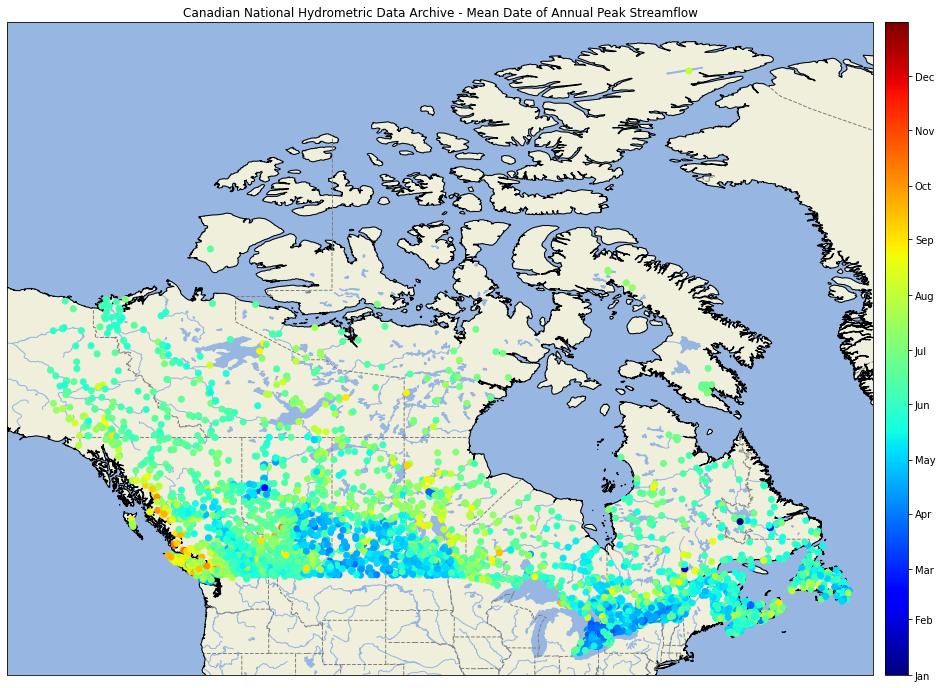

In [359]:
fig = plt.figure(figsize=(16,12), frameon=True)  
ax = plt.axes(projection=ccrs.Miller())
ax.set_extent([-146,-50,40,81]) # Can
#ax.set_extent([-97,-51,41,61]) # East
#ax.set_extent([-140,-90,45,60]) # West 
#ax.set_extent([-143,-60,58,81]) # North

scale = '10m'
ax.add_feature(cfeature.LAND.with_scale(scale))  
ax.add_feature(cfeature.OCEAN.with_scale(scale))     
ax.add_feature(cfeature.LAKES.with_scale(scale))
ax.add_feature(cfeature.RIVERS.with_scale(scale))

coast = cfeature.NaturalEarthFeature(category='physical', scale=scale,    
                            facecolor='none', name='coastline')
ax.add_feature(coast, edgecolor='black')    

states_provinces = cfeature.NaturalEarthFeature(
            category='cultural',
            name='admin_1_states_provinces_lines',
            scale=scale,
            facecolor='none')    
ax.add_feature(states_provinces, edgecolor='grey', linestyle='dashed')

cmap = plt.get_cmap('jet')
levels = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
ticks = levels.copy()
p = ax.scatter(gdf.LONGITUDE, gdf.LATITUDE, c=gdf.MAX_DOY, cmap=cmap, transform=ccrs.PlateCarree(), 
               #norm=mcolors.BoundaryNorm(levels, ncolors=15, extend='both'),
               vmin=1, vmax=365, label='none', zorder=10)
ax.set_title(f"Canadian National Hydrometric Data Archive - Mean Date of Annual Peak Streamflow")

# add colorbar as separate axis and make it the right size
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
cb = plt.colorbar(p, cax=cax, ticks=ticks)
cb.ax.set_yticklabels(list(range(1,13,1)))
cb.ax.set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) 
plt.show()

/home/bruxerjk/miniconda3/envs/geo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


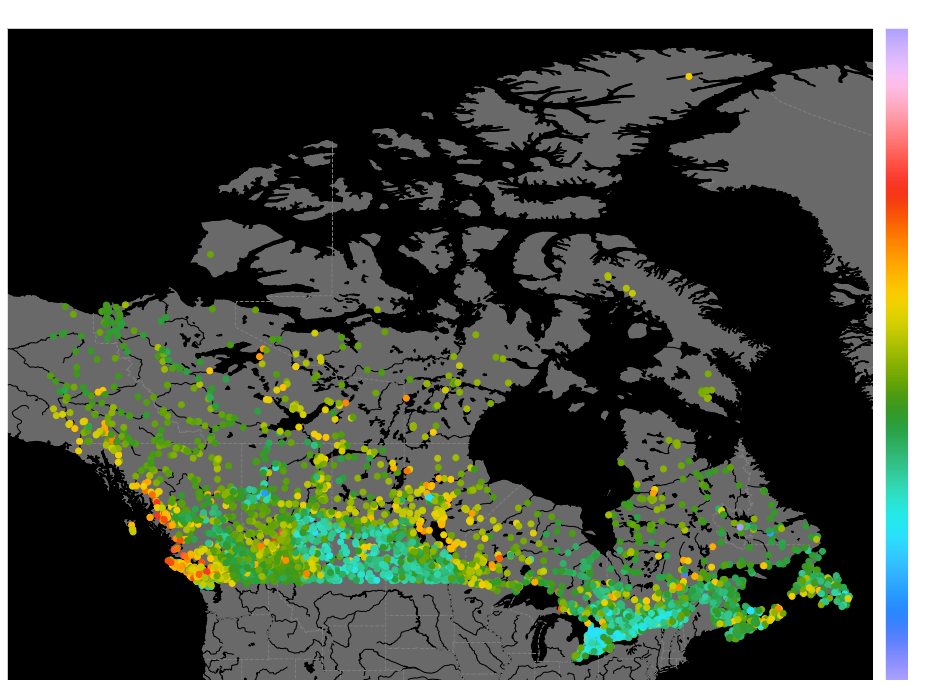

In [360]:
fig = plt.figure(figsize=(16,12), frameon=True)  
ax = plt.axes(projection=ccrs.Miller())
ax.set_extent([-146,-50,40,81]) # Can
#ax.set_extent([-97,-51,41,61]) # East
#ax.set_extent([-140,-90,45,60]) # West 
#ax.set_extent([-143,-60,58,81]) # North

scale = '10m'
b = 'black'
ax.add_feature(cfeature.LAND.with_scale(scale), color='dimgrey')  
ax.add_feature(cfeature.OCEAN.with_scale(scale), color=b)     
ax.add_feature(cfeature.LAKES.with_scale(scale), color=b)   
ax.add_feature(cfeature.RIVERS.with_scale(scale), color=b)  

coast = cfeature.NaturalEarthFeature(category='physical', scale=scale,    
                            facecolor='none', name='coastline')
ax.add_feature(coast, edgecolor='black')    

states_provinces = cfeature.NaturalEarthFeature(
            category='cultural',
            name='admin_1_states_provinces_lines',
            scale=scale,
            facecolor='none')    
ax.add_feature(states_provinces, edgecolor='grey', linestyle='dashed')

cmap = plt.get_cmap("cet_CET_C6s_r")
#cmap = plt.get_cmap("cet_colorwheel")
levels = [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335]
ticks = levels.copy()

p = ax.scatter(gdf.LONGITUDE, gdf.LATITUDE, c=gdf.MAX_DOY, cmap=cmap, transform=ccrs.PlateCarree(), 
               #norm=mcolors.BoundaryNorm(levels, ncolors=15, extend='both'),
               vmin=1, vmax=365, label='none', zorder=10)
ax.set_title(f"Canadian National Hydrometric Data Archive - Mean Date of Annual Peak Streamflow", fontsize=20, fontweight=0, loc='left', style='italic', color='white')

# add colorbar as separate axis and make it the right size
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
cb = plt.colorbar(p, cax=cax, ticks=ticks)
cb.ax.set_yticklabels(list(range(1,13,1)))
cb.ax.set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']) 
# set colorbar tick color
cb.ax.yaxis.set_tick_params(color='white', labelsize=14, labelcolor='white')
# set colorbar edgecolor 
cb.outline.set_edgecolor('white')
# set plot outline color
for spine in ax.spines.values():
    spine.set_edgecolor('white')
    
plt.savefig('peak_flow_1.png', facecolor='black', bbox_inches='tight')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
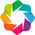

In [263]:
import geoviews as gv
import holoviews as hv
from geoviews import opts
import geoviews.feature as gf
gv.extension('bokeh')
hv.output(backend='bokeh')


In [255]:
gdf['geometry'].head()

0    POINT (-124.90111 57.19111)
1    POINT (-121.76111 55.18778)
2    POINT (-120.94183 55.09017)
3    POINT (-121.63000 55.69583)
4    POINT (-133.54028 58.63889)
Name: geometry, dtype: geometry

In [257]:
points = gdf.to(gv.Points, ['LONGITUDE', 'LATITUDE'], ['MAX_DOY'])

AttributeError: 'GeoDataFrame' object has no attribute 'to'

In [256]:
p = gv.Points(gdf, vdims='MAX_DOY').opts(projection=ccrs.PlateCarree(), width=600, tools=['hover'])
p

:Points   [STATION_NUMBER,STATION_NAME]   (MAX_DOY)

In [254]:
gf.ocean * p

TypeError: Feature.range() got an unexpected keyword argument 'dimension_range'

:Overlay
   .Ocean.I  :Feature   [Longitude,Latitude]
   .Points.I :Points   [STATION_NUMBER,STATION_NAME]   (MAX_DOY)